In [1]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
%matplotlib inline

# Camera Calibration

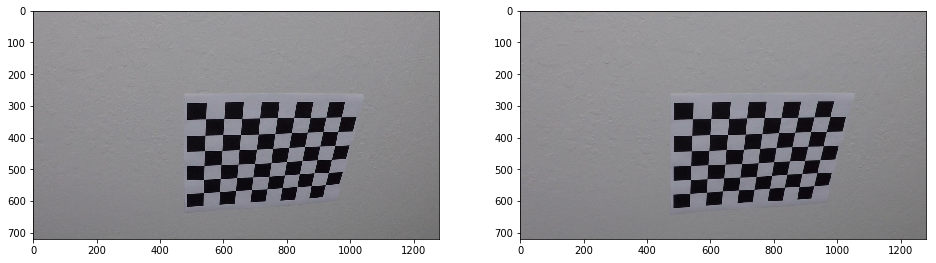

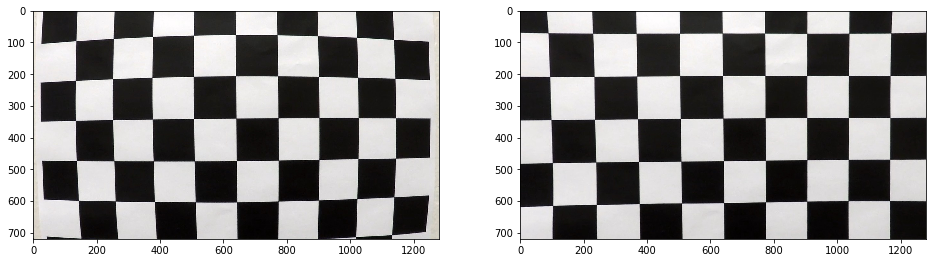

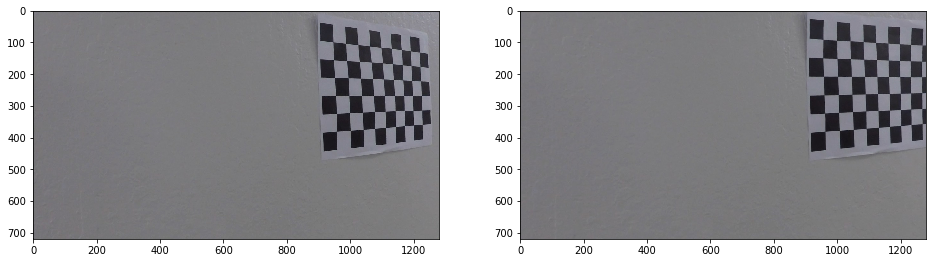

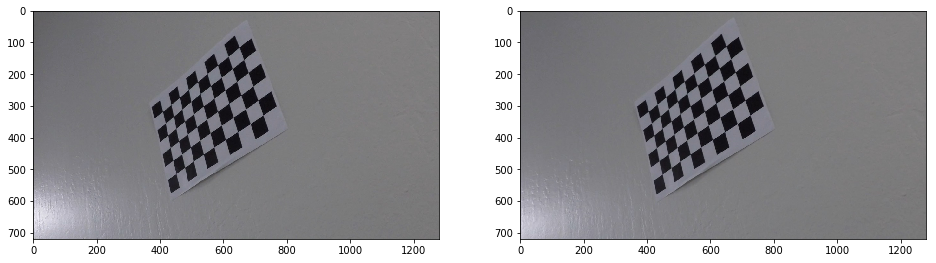

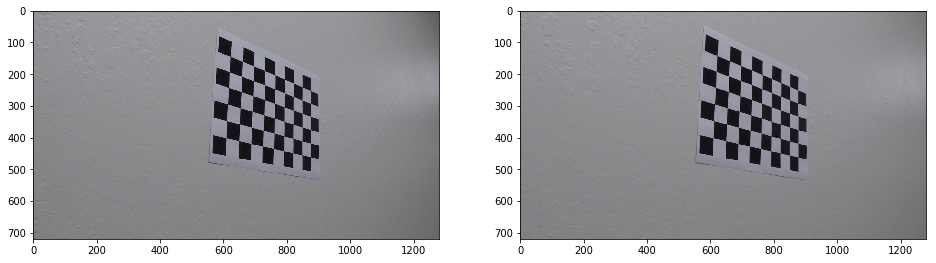

...

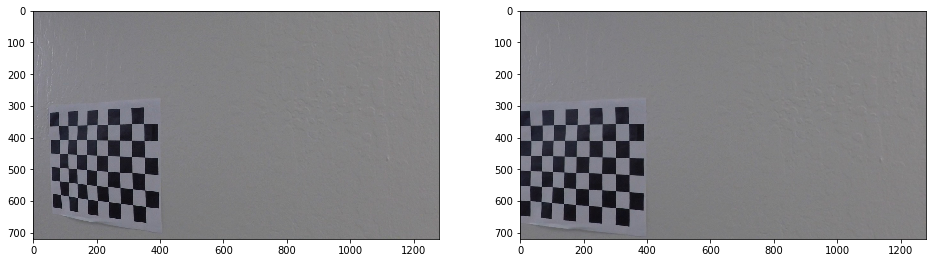

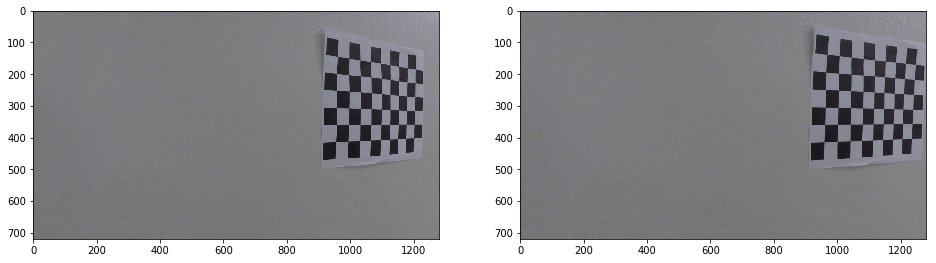

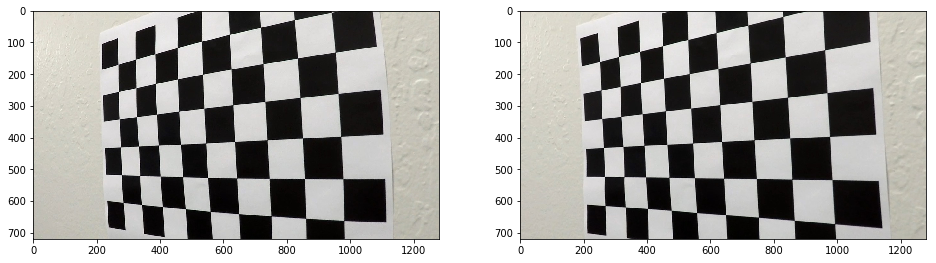

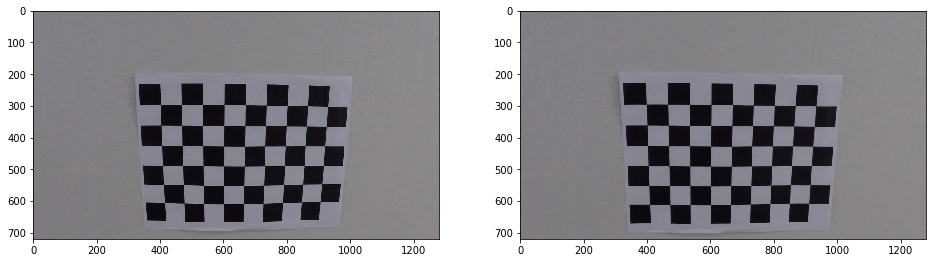

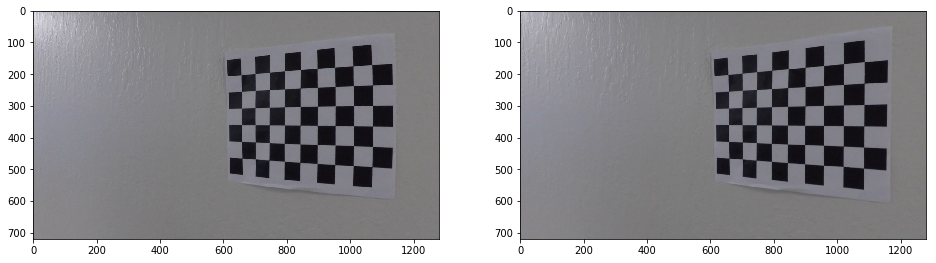

In [2]:
from glob import glob

nx = 9
ny = 6

objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:ny, 0:nx].T.reshape(-1,2)

imgpoints, objpoints = [], []

calibration_imgs = []
for img_loc in glob('camera_cal/calibration*.jpg'):
    calibration_imgs.append(cv2.cvtColor(cv2.imread(img_loc), cv2.COLOR_BGR2RGB))
    gray = cv2.cvtColor(cv2.imread(img_loc), cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (ny, nx),None)
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, calibration_imgs[0].shape[:2][::-1],None,None)

for img in calibration_imgs:
    plt.figure(figsize=(16,8))
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    ax = plt.subplot(1,2,1)
    plt.imshow(img)
    ax = plt.subplot(1,2,2)
    plt.imshow(dst)
    plt.show()

# Distortion and Warping

In [3]:
def undistort_image(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

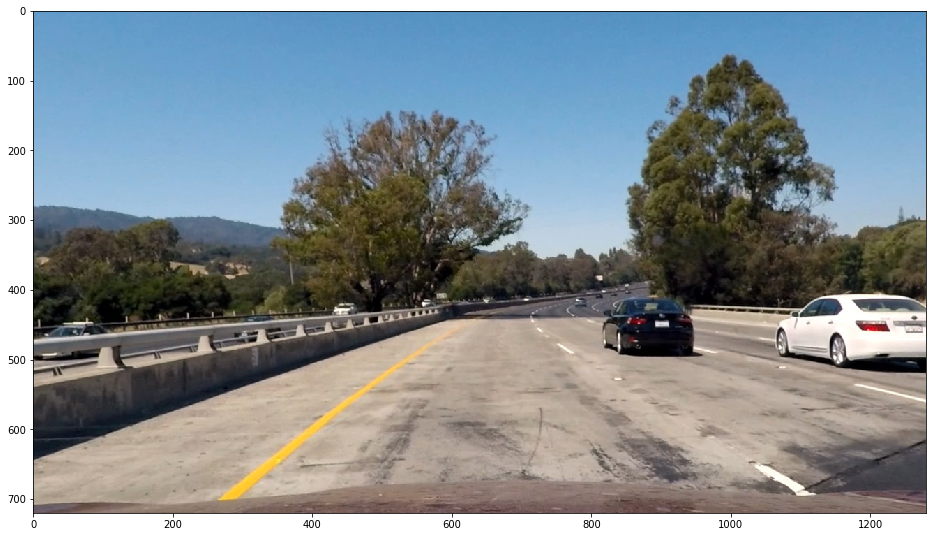

In [4]:
raw = cv2.cvtColor(cv2.imread('test_images/test1.jpg'), cv2.COLOR_BGR2RGB)
img = undistort_image(raw)
plt.figure(figsize=(16,16))
plt.imshow(img)
plt.show()

In [5]:
def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    mask = (s_channel > thresh[0]) & (s_channel <= thresh[1])
    binary_output = np.zeros_like(s_channel)
    binary_output[mask] = 1
    return binary_output

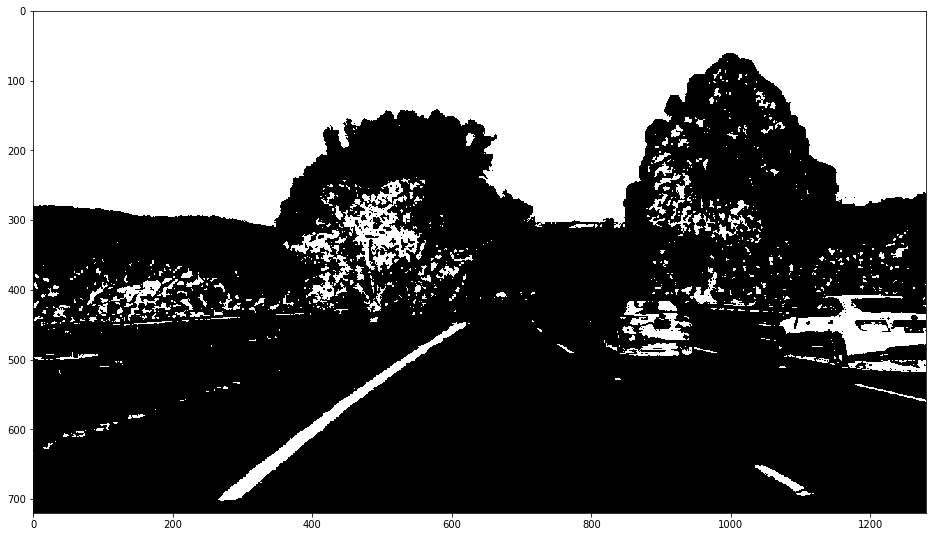

In [6]:
plt.figure(figsize=(16,16))
plt.imshow(hls_select(img, thresh=(100,255)),cmap='gray')
plt.show()

In [7]:
def gradx_select(img, thresh=(0,255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    scaled_sobel = np.uint8(255*sobelx/np.max(sobelx))

    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel > thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_output

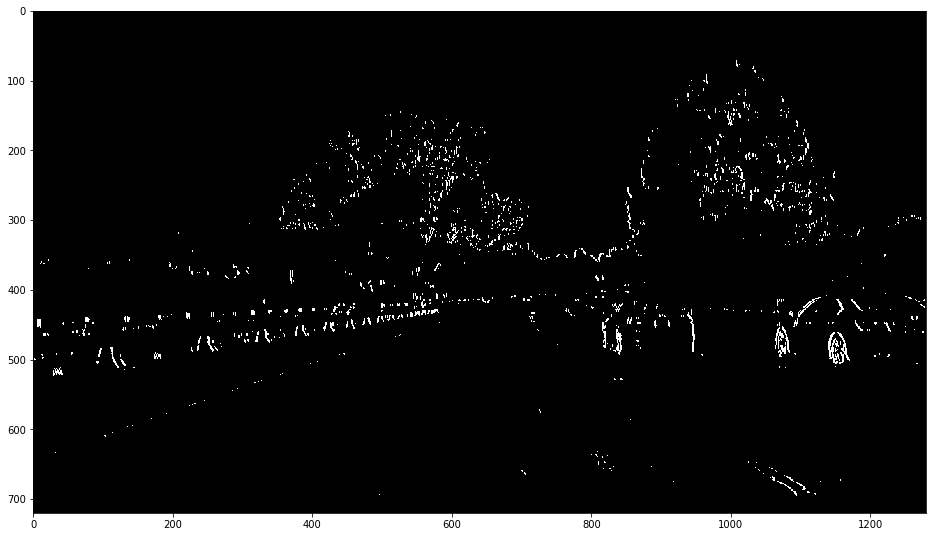

In [8]:
plt.figure(figsize=(16,16))
plt.imshow(gradx_select(img, thresh=(50,255)),cmap='gray')
plt.show()

In [9]:
def binary_select(img, hls_thresh=(0,255), grad_thresh=(0,255)):
    hls = hls_select(img, thresh=hls_thresh)
    grad = gradx_select(img, thresh=grad_thresh)
    binary = np.zeros_like(grad)
    binary[(grad==1)|(hls==1)] = 1
    return binary

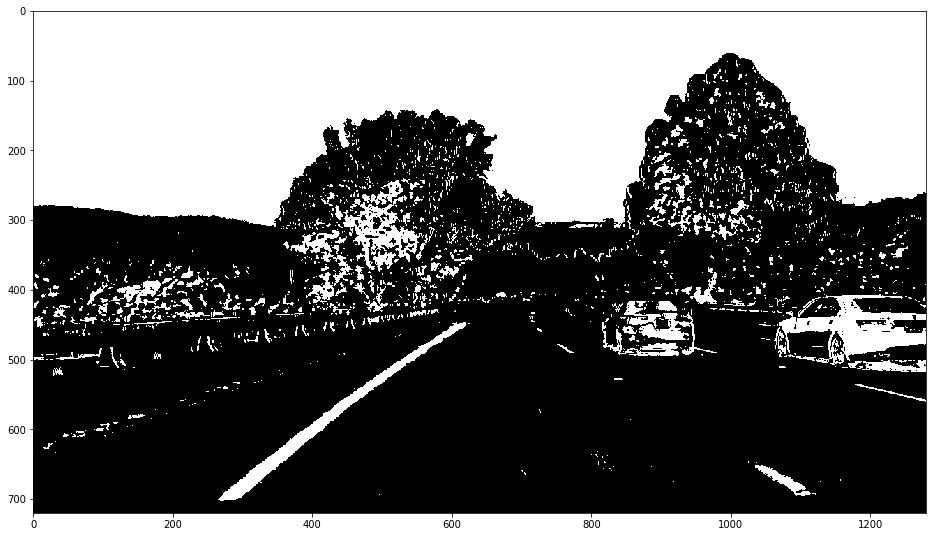

In [10]:
plt.figure(figsize=(16,16))
plt.imshow(binary_select(img, hls_thresh=(100, 255), grad_thresh=(50, 255)), cmap='gray')
plt.show()

In [11]:
def get_vertices(img, outer_x_buffer = 0.05, inner_x_buffer=0.1, upper_ratio=0.65):
    return np.array([[
        (img.shape[1]*(0.5 - inner_x_buffer), img.shape[0] * upper_ratio), 
        (img.shape[1]*(0.5 + inner_x_buffer), img.shape[0] * upper_ratio),
        (img.shape[1]*(1 - outer_x_buffer), img.shape[0]),
        (img.shape[1]*outer_x_buffer, img.shape[0]),
    ]], dtype=np.int32)

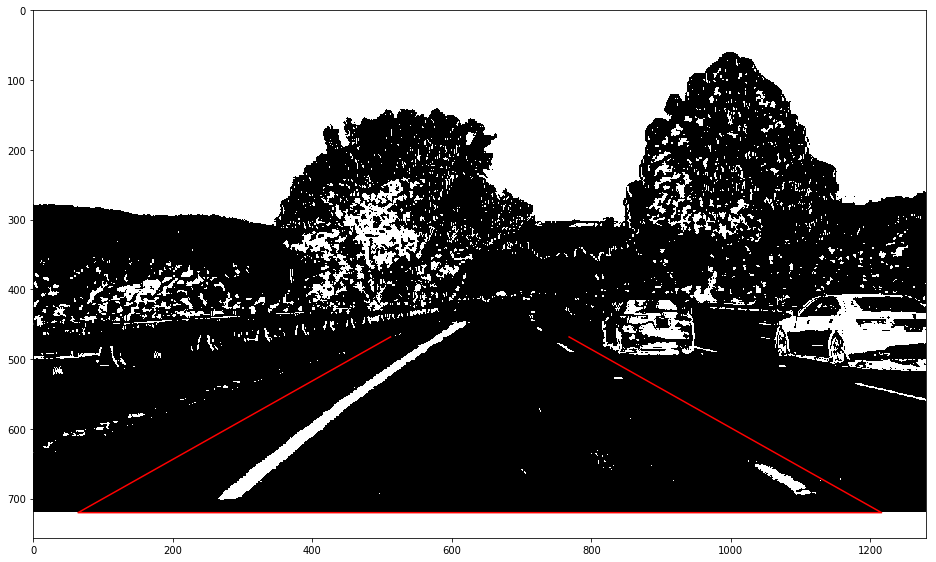

In [12]:
vert = get_vertices(img)

plt.figure(figsize=(16,16))
plt.imshow(binary_select(img, hls_thresh=(100, 255), grad_thresh=(50, 255)), cmap='gray')
plt.plot(np.roll(vert[0,:,0], -1), np.roll(vert[0,:,1], -1), c='red')
plt.show()

In [13]:
def get_src_dst(img, offset = 100):
    img_size = (gray.shape[1], gray.shape[0])

    src = get_vertices(img).astype(np.float32)
    dst = np.float32([
        [offset, offset], 
        [img_size[0]-offset, offset], 
        [img_size[0]-offset, img_size[1]-offset], 
        [offset, img_size[1]-offset]
    ])
    return src, dst

In [14]:
src, dst = get_src_dst(img)
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

In [15]:
warped = cv2.warpPerspective(binary_select(img, hls_thresh=(100, 255), grad_thresh=(50, 255)), M, img.shape[:2][::-1])

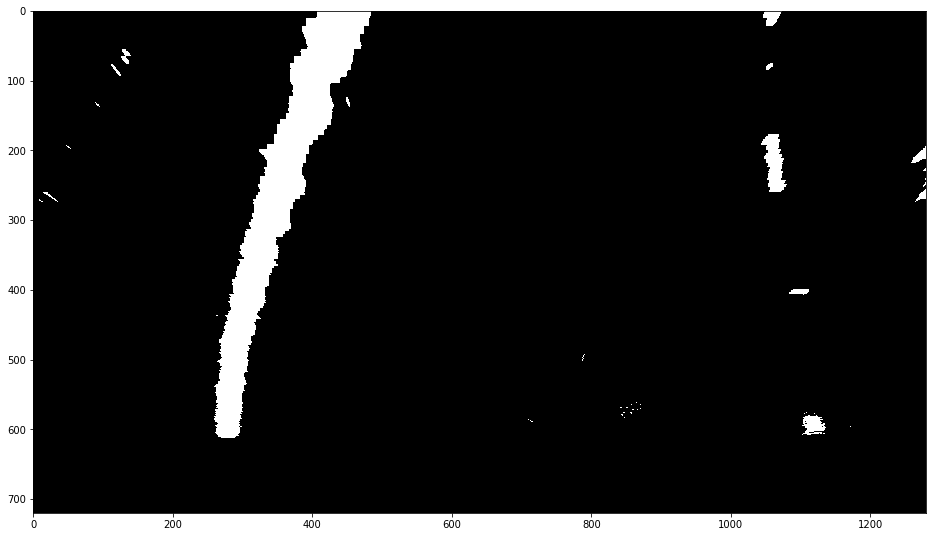

In [16]:
plt.figure(figsize=(16,16))
plt.imshow(warped, cmap='gray')
plt.show()

# Detect Lanes

In [17]:
class LaneWindow(object):
    
    def __init__(self, center=0, height=50, margin=100, offset_x=0, offset_y=0):
        self.center = int(center)
        self.margin = int(margin)
        self.offset_x = int(offset_x)
        self.offset_y = int(offset_y)
        self.height = int(height)
        self.y_low = int(self.offset_y)
        self.y_high = int(self.offset_y + self.height)
        self.x_low = int(self.offset_x + self.center - self.margin)
        self.x_high = int(self.offset_x + self.center + self.margin)
        self.undeteched_cnt = 0
        self.update_backward = False
        self.update_forward = False
        self.forward = None
        self.backward = None
        self.current_x = np.array([])
        self.current_y = np.array([])
        
        
    def set_forward_neighbor(self, Neighbor, update=True):
        self.forward = Neighbor
        self.update_forward = update
        self.forward.backward = self
        
    def set_backward_neighbor(self, Neighbor, update=True):
        self.backward = Neighbor
        self.update_backward = update
        self.backward.forward = self
    
    def update_center(self, center):
        self.center = center
        self.x_low = int(self.offset_x + self.center - self.margin)
        self.x_high = int(self.offset_x + self.center + self.margin)
    
    def update(self, x_data, y_data):
        indexes = (
            (x_data >= self.x_low) &\
            (x_data < self.x_high) &\
            (y_data >= self.y_low) &\
            (y_data < self.y_high)
        ).nonzero()[0]
        
        if indexes.size == 0:
            self.undeteched_cnt += 1
            self.current_x = np.array([])
            self.current_y = np.array([])
            return
        
        self.undeteched_cnt = 0
        self.current_x = x_data[indexes]
        self.current_y = y_data[indexes]
        
        self.update_center(np.average(self.current_x))
        
        if self.update_forward and self.forward is not None:
            self.forward.update_center(self.center)
        if self.update_backward and self.backward is not None:
            self.backward.update_center(self.center)
        return 
    
    
    def draw(self, img, color=(0,255,0), width=2):
        if self.undeteched_cnt > 0:
            color = (255, 0 , 0)
        cv2.rectangle(
            img, 
            (self.x_low, self.y_low),
            (self.x_high, self.y_high),
            color, 
            width
        )
            

In [85]:

from sklearn.linear_model.stochastic_gradient import SGDRegressor

In [36]:
class Lane(object):
    
    def __init__(self, init_x, img_height, n_windows=10, margin=100):
        
        
        self.img_height = img_height
        self.n_windows = n_windows
        self.window_height = np.int(self.img_height/self.n_windows)
        self.windows = []
        self.current_x = []
        self.current_y = []
        self.current_poly_fit = None
        self.current_poly = None
        self.ys = np.array(list(range(self.img_height)))
        self.regressor = SGDRegressor()
        
        for i in range(self.n_windows):
            self.windows.append(
                LaneWindow(
                    center=init_x,
                    height=self.window_height,
                    offset_y=self.img_height-(i+1)*self.window_height
                )
            )
            if i > 0:
                self.windows[i-1].set_forward_neighbor(self.windows[i])
            
    def update(self, x_data, y_data):
        self.current_x = []
        self.current_y = []
        for window in self.windows:
            window.update(x_data, y_data)
            self.current_x.extend(window.current_x)
            self.current_y.extend(window.current_y)
        
        if len(window.current_y) > 10:
            self.current_poly_fit = np.polyfit(
                self.current_y, 
                self.current_x, 
                2
            )
            self.current_poly = np.poly1d(self.current_poly_fit)
            self.
            
    def predict_points(self):
        if self.current_poly is not None:
            pts = np.array(
                    list(zip(self.current_poly(self.ys), self.ys)), 
                    np.int32
            ).reshape((-1,1,2))
            return pts
        return None
    
    def draw(self, img, color=(0, 255, 0), width=2):
        for window in self.windows:
            window.draw(img, color=color, width=width)
        
        pts = self.predict_points()
        if pts is not None:
            cv2.polylines(
                img,
                pts,
                True,
                (0,255,255),
                25
             )

In [37]:
midpoint = np.int(warped.sum(axis=0).shape[0]/2)

In [38]:
left_x = np.argmax(warped.sum(axis=0)[:midpoint])
right_x = midpoint + np.argmax(warped.sum(axis=0)[midpoint:])

In [50]:
n_windows = 8
window_height = np.int(warped.shape[0]/n_windows)
window_width = 100

In [51]:
LeftLane = Lane(left_x, warped.shape[0])
RightLane = Lane(right_x, warped.shape[0])

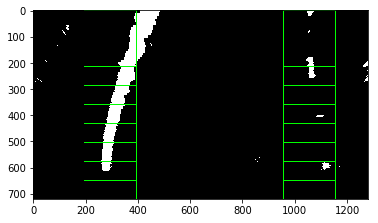

In [52]:
warped_c = warped.copy()
warped_c = np.dstack([warped_c, warped_c, warped_c])
LeftLane.draw(warped_c)
RightLane.draw(warped_c)
plt.imshow((warped_c > 0).astype(np.uint8)*255)

In [53]:
y, x = warped.nonzero()

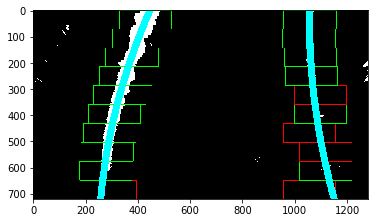

In [54]:
warped_c = warped.copy()
warped_c = np.dstack([warped_c, warped_c, warped_c])
LeftLane.update(x,y)
RightLane.update(x,y)
LeftLane.draw(warped_c)
RightLane.draw(warped_c)
plt.imshow((warped_c > 0).astype(np.uint8)*255)

In [55]:
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))

NameError: name 'window_img' is not defined

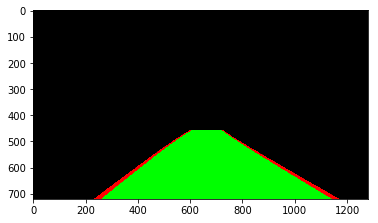

In [56]:
blank = np.zeros_like(warped_c).astype(np.uint8)

l_pts = LeftLane.predict_points()
r_pts =RightLane.predict_points()
cv2.fillPoly(
    blank, 
    np.hstack([l_pts,r_pts]), 
    (0,255, 0)
)
cv2.polylines(
    blank,
    l_pts,
    True,
    (255,0,0),
    25
 )
cv2.polylines(
    blank,
    r_pts,
    True,
    (255,0,0),
    25
 )
blank = cv2.warpPerspective(
    blank, 
    Minv, 
    blank.shape[:2][::-1]
)
plt.imshow(blank)

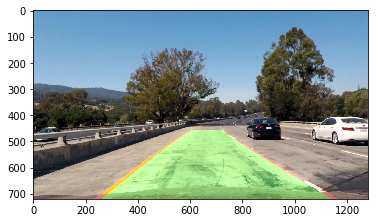

In [57]:
result = cv2.addWeighted(img, 1, blank, 0.3, 0)
plt.imshow(result)

In [82]:
class LanePipeLine():
    
    def __init__(self, mtx, dist, n_windows=10, margin=100):
        self.mtx = mtx
        self.dist = dist
        self.n_windows = n_windows
        self.margin = margin
        self.left_lane = None
        self.right_lane = None
        self.initalized = False
        self.midpoint = None
        self.M = None
        self.Minv = None
        
    def transform(self, img):
        
        undist = self.undistort_image(img)
        binary = self.binary_select(
            undist, 
            hls_thresh=(100, 255), 
            grad_thresh=(50, 255)
        )
        
        if not self.initalized:
            src, dst = self.get_src_dst(img)
            self.M = cv2.getPerspectiveTransform(src, dst)
            self.Minv = cv2.getPerspectiveTransform(dst, src)
        
        
        warped = cv2.warpPerspective(
            binary, 
            M, 
            img.shape[:2][::-1]
        )
        
        
        if not self.initalized:
            hist = warped.sum(axis=0)
            midpoint = np.int(hist.shape[0]/2)
            left_x = np.argmax(hist[:midpoint])
            right_x = midpoint + np.argmax(hist[midpoint:])
            self.left_lane =  Lane(
                left_x, 
                img.shape[0], 
                n_windows=self.n_windows,
                margin=self.margin
            )
            self.right_lane =  Lane(
                right_x, 
                img.shape[0], 
                n_windows=self.n_windows,
                margin=self.margin
            )
            self.initalized = True
            
        y, x = warped.nonzero()
        self.left_lane.update(x,y)
        self.right_lane.update(x,y)
        
        warped_c = warped.copy() * 255 / warped.max()
        warped_c = np.dstack([warped_c,warped_c,warped_c]).astype(np.uint8)
        self.left_lane.draw(warped_c)
        self.right_lane.draw(warped_c)
        
        return warped_c
            
        blank = np.zeros_like(img).astype(np.uint8)
                                     
        left_pts = self.left_lane.predict_points()
        right_pts = self.right_lane.predict_points()
                                     
        cv2.fillPoly(
            blank, 
            np.hstack([left_pts,right_pts]), 
            (0,255, 0)
        )
        cv2.polylines(
            blank,
            left_pts,
            True,
            (255,0,0),
            25
         )
        cv2.polylines(
            blank,
            right_pts,
            True,
            (255,0,0),
            25
        )
        
        blank = cv2.warpPerspective(
            blank, 
            self.Minv, 
            blank.shape[:2][::-1]
        )
        result = cv2.addWeighted(undist, 1, blank, 0.3, 0)
        return result
                                     
    def undistort_image(self, img):
        return cv2.undistort(img, self.mtx, self.dist, None, self.mtx)
    
    def gradx_select(self, img, thresh=(0,255)):
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        sobelx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
        scaled_sobel = np.uint8(255*sobelx/np.max(sobelx))

        binary_output = np.zeros_like(scaled_sobel)
        binary_output[(scaled_sobel > thresh[0]) & (scaled_sobel <= thresh[1])] = 1
        return binary_output
    
    def hls_select(self, image, thresh=(0, 255)):
        hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        s_channel = hls[:,:,2]
        mask = (s_channel > thresh[0]) & (s_channel <= thresh[1])
        binary_output = np.zeros_like(s_channel)
        binary_output[mask] = 1
        return binary_output
    
    def binary_select(self, image, hls_thresh=(0,255), grad_thresh=(0,255)):
        hls = self.hls_select(image, thresh=hls_thresh)
        grad = self.gradx_select(image, thresh=grad_thresh)
        binary = np.zeros_like(grad)
        binary[(grad==1)|(hls==1)] = 1
        return binary
            
    def get_vertices(self, img, outer_x_buffer = 0.025, inner_x_buffer=0.1, upper_ratio=0.65):
        return np.array([[
            (img.shape[1]*(0.5 - inner_x_buffer), img.shape[0] * upper_ratio), 
            (img.shape[1]*(0.5 + inner_x_buffer), img.shape[0] * upper_ratio),
            (img.shape[1]*(1 - outer_x_buffer), img.shape[0]),
            (img.shape[1]*outer_x_buffer, img.shape[0]),
        ]], dtype=np.int32)
            
    def get_src_dst(self, img, offset = 100):
        img_size = (img.shape[1], img.shape[0])

        src = self.get_vertices(img).astype(np.float32)
        dst = np.float32([
            [offset, offset], 
            [img_size[0]-offset, offset], 
            [img_size[0]-offset, img_size[1]-offset], 
            [offset, img_size[1]-offset]
        ])
        return src, dst

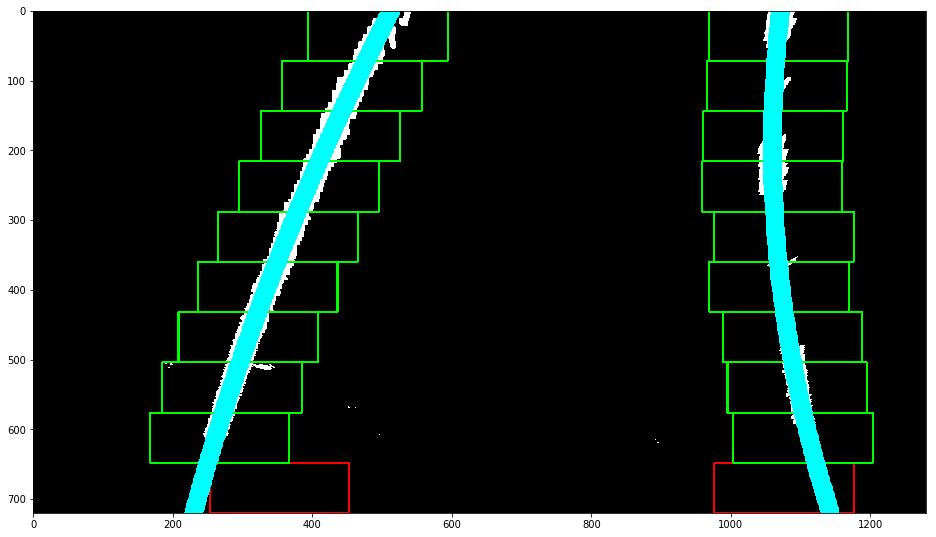

In [83]:
pipeline = LanePipeLine(mtx, dist)
plt.figure(figsize=(16,16))
plt.imshow(pipeline.transform(raw))
plt.show()

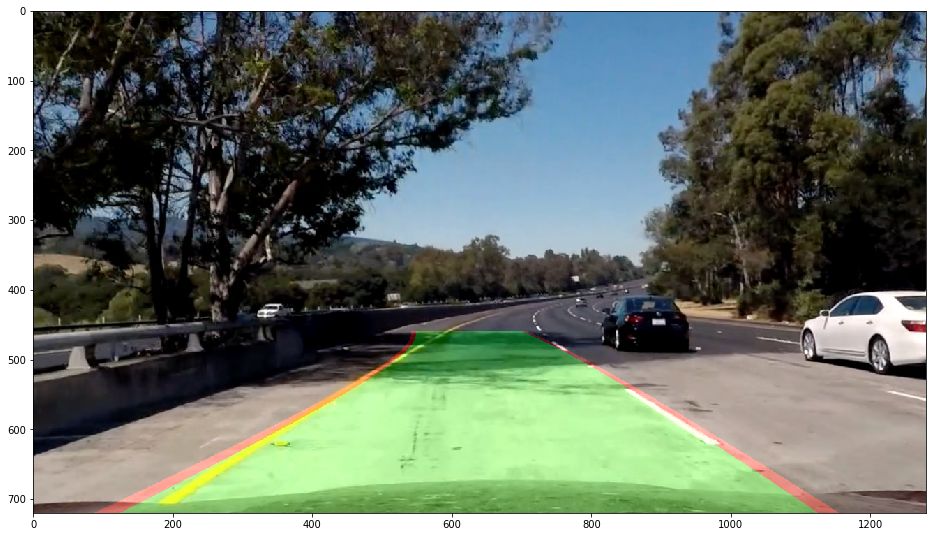

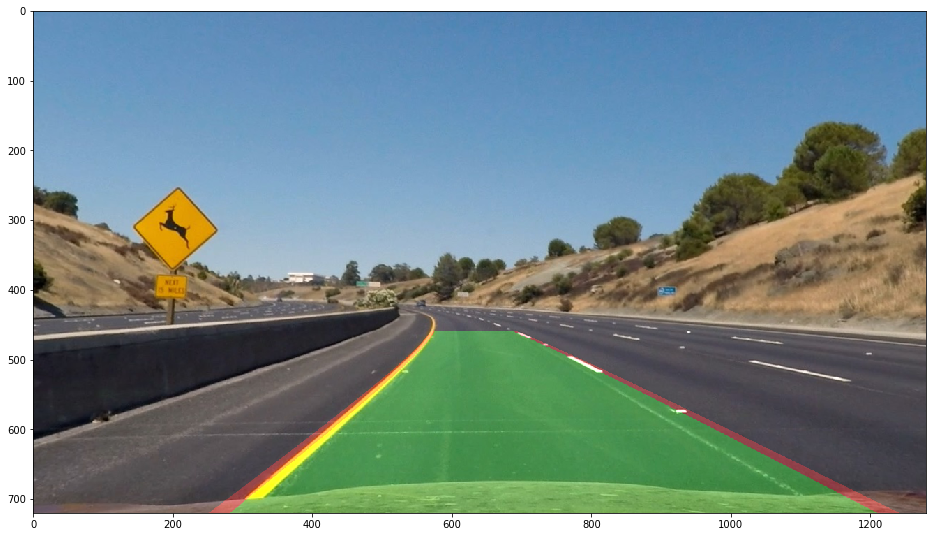

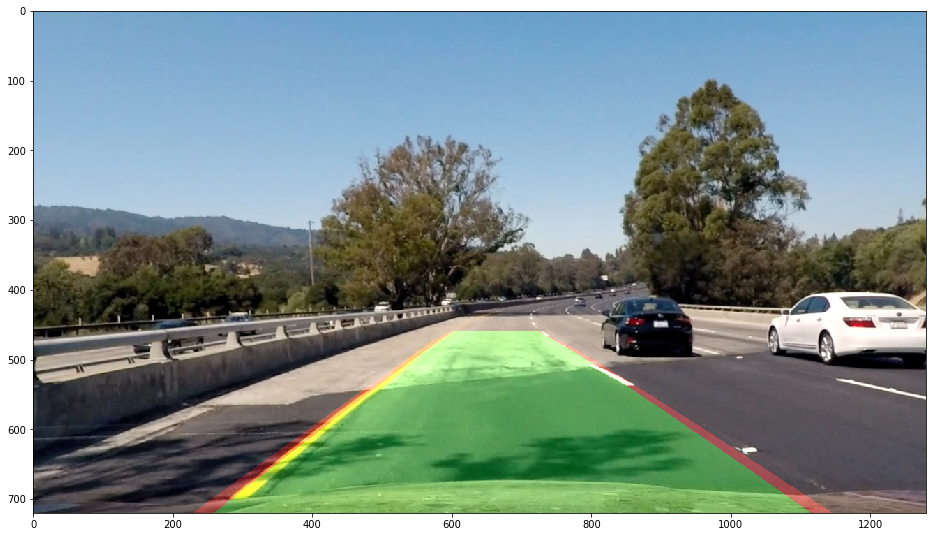

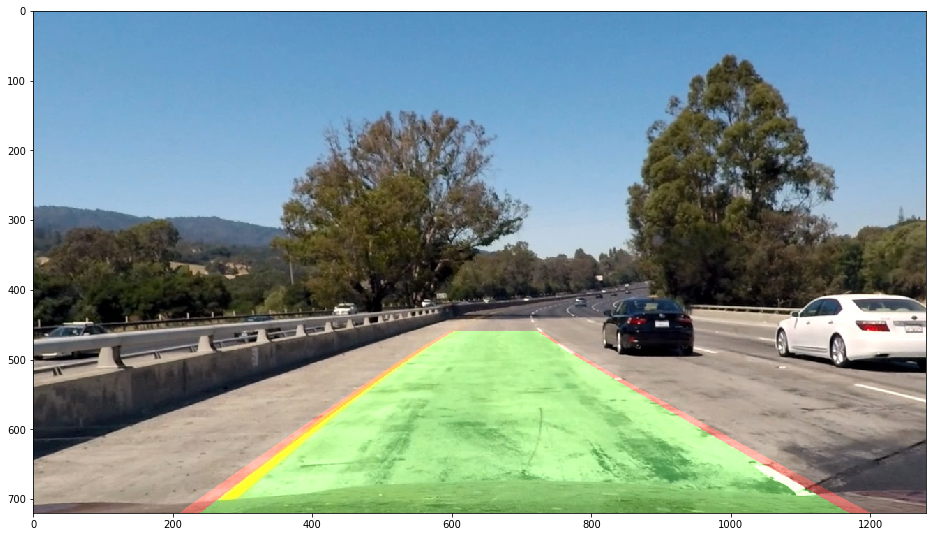

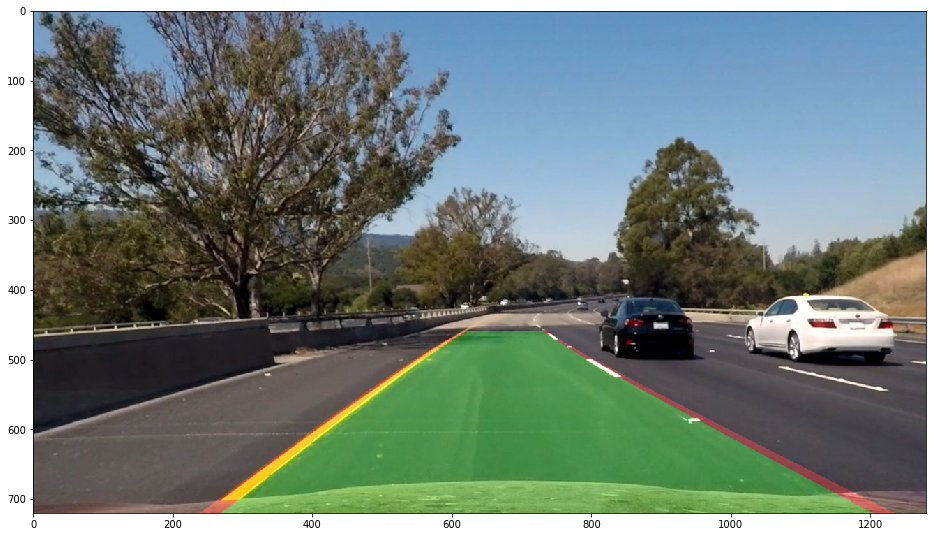

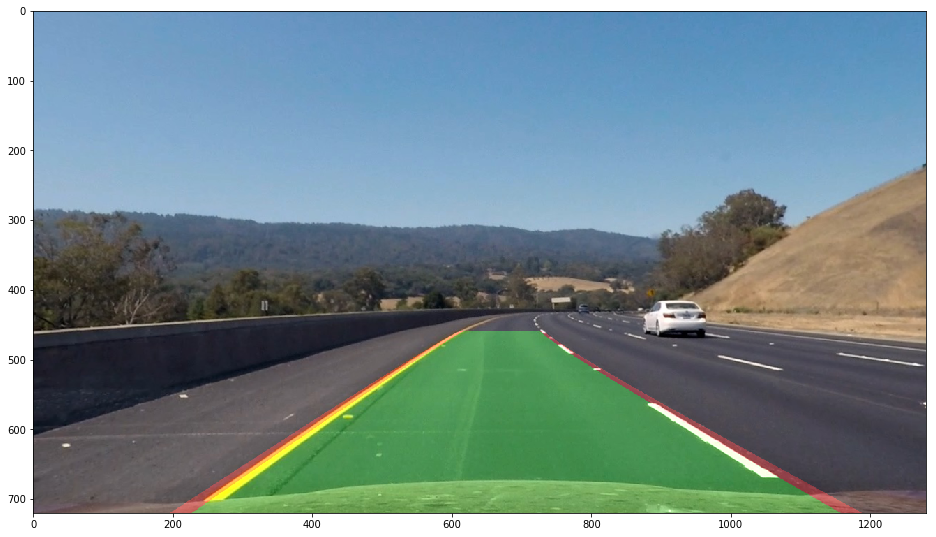

In [60]:
for test_img in glob('test_images/test*.jpg'):
    raw = cv2.cvtColor(cv2.imread(test_img), cv2.COLOR_BGR2RGB)
    pipeline = LanePipeLine(mtx, dist)
    plt.figure(figsize=(16,16))
    plt.imshow(pipeline.transform(raw))
    plt.show()

In [750]:
import imageio
imageio.plugins.ffmpeg.download()

Imageio: 'ffmpeg.linux64' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg.linux64 (27.2 MB)
Downloading: 8192/28549024 bytes (0.01531904/28549024 bytes (5.4%3391488/28549024 bytes (11.95881856/28549024 bytes (20.68560640/28549024 bytes (30.011059200/28549024 bytes (38.7%13754368/28549024 bytes (48.2%16089088/28549024 bytes (56.4%18694144/28549024 bytes (65.5%21413888/28549024 bytes (75.0%24109056/28549024 bytes (84.4%26828800/28549024 bytes (94.0%28549024/28549024 bytes (100.0%)
  Done
File saved as /home/bryan/.imageio/ffmpeg/ffmpeg.linux64.


In [84]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

pipeline = LanePipeLine(mtx, dist)

def process_image(image):
    result = pipeline.transform(image)
    return result

project_output = 'project_video_transformed_warped.mp4'
clip1 = VideoFileClip("project_video.mp4")
project_output_clip = clip1.fl_image(process_image)

%time project_output_clip.write_videofile(project_output, audio=False, codec='mpeg4')

[MoviePy] >>>> Building video project_video_transformed_warped.mp4
[MoviePy] Writing video project_video_transformed_warped.mp4



 24%|██▍       | 302/1261 [00:18<00:59, 16.08it/s]


 48%|████▊     | 604/1261 [00:37<00:37, 17.59it/s]


 72%|███████▏  | 906/1261 [00:55<00:21, 16.23it/s]


 95%|█████████▌| 1204/1261 [01:14<00:03, 16.11it/s]


100%|█████████▉| 1260/1261 [01:17<00:00, 16.03it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_transformed_warped.mp4 

CPU times: user 4min 46s, sys: 1.57 s, total: 4min 48s
Wall time: 1min 17s


In [78]:
pipeline = LanePipeLine(mtx, dist)

def process_image(image):
    result = pipeline.transform(image)
    return result

project_output = 'challenge_video_transformed_warped.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
project_output_clip = clip1.fl_image(process_image)

%time project_output_clip.write_videofile(project_output, audio=False, codec='mpeg4')

[MoviePy] >>>> Building video challenge_video_transformed_warped.mp4
[MoviePy] Writing video challenge_video_transformed_warped.mp4



 95%|█████████▌| 462/485 [00:21<00:01, 21.59it/s]


100%|██████████| 485/485 [00:22<00:00, 21.54it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_transformed_warped.mp4 

CPU times: user 1min 40s, sys: 452 ms, total: 1min 40s
Wall time: 22.5 s


In [79]:
pipeline = LanePipeLine(mtx, dist)

def process_image(image):
    result = pipeline.transform(image)
    return result

project_output = 'harder_challenge_video_warped.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
project_output_clip = clip1.fl_image(process_image)

%time project_output_clip.write_videofile(project_output, audio=False, codec='mpeg4')

[MoviePy] >>>> Building video harder_challenge_video_warped.mp4
[MoviePy] Writing video harder_challenge_video_warped.mp4



 38%|███▊      | 452/1200 [00:21<00:34, 21.40it/s]


 75%|███████▌  | 905/1200 [00:42<00:13, 21.46it/s]


100%|█████████▉| 1199/1200 [00:56<00:00, 21.22it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_warped.mp4 

CPU times: user 4min 14s, sys: 1.41 s, total: 4min 15s
Wall time: 56.6 s


In [389]:
left_lanes, right_lanes = [], []
for i in range(n_windows):
    llane = LaneWindow(
        center=left_x,
        height=window_height,
        offset_y=warped.shape[0]-(i+1)*window_height
    )
    rlane = LaneWindow(
        center=right_x,
        height=window_height,
        offset_x=0,
        offset_y=warped.shape[0]-(i+1)*window_height
    )
    left_lanes.append(llane)
    right_lanes.append(rlane)
    if i > 0:
        left_lanes[i-1].set_forward_neighbor(llane)
        right_lanes[i-1].set_forward_neighbor(rlane)

(0, 630, 294) (0, 630, 1056)
(0, 540, 294) (0, 540, 1056)
(0, 450, 294) (0, 450, 1056)
(0, 360, 294) (0, 360, 1056)
(0, 270, 294) (0, 270, 1056)
(0, 180, 294) (0, 180, 1056)
(0, 90, 294) (0, 90, 1056)
(0, 0, 294) (0, 0, 1056)


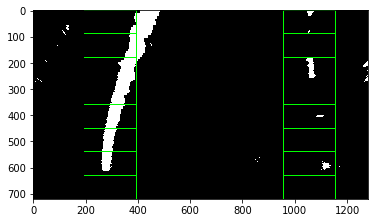

In [390]:
warped_c = warped.copy()
warped_c = np.dstack([warped_c, warped_c, warped_c])
for llane, rlane in zip(left_lanes, right_lanes):
    print(
        (llane.offset_x, llane.offset_y, llane.center),
        (rlane.offset_x, rlane.offset_y, rlane.center)
    )
    llane.draw(warped_c)
    rlane.draw(warped_c)

plt.imshow((warped_c > 0).astype(np.uint8)*255)

In [391]:
y, x = warped.nonzero()

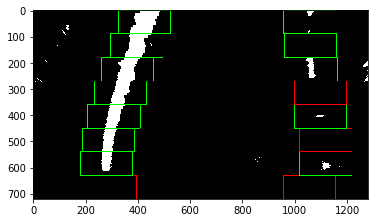

In [393]:
warped_c = warped.copy()
warped_c = np.dstack([warped_c, warped_c, warped_c])
for i,(llane, rlane) in enumerate(zip(left_lanes, right_lanes)):
    llane.update(x, y)
    llane.draw(warped_c)
    rlane.update(x, y)
    rlane.draw(warped_c)
plt.imshow((warped_c > 0).astype(np.uint8)*255)

In [247]:
for i in range(n_windows):
    win_y_low = warped.shape[0] - (i+1)*window_height
    win_y_high = warped.shape[0] - i*window_height
    win_x_low = left_box_centers[i] - window_width
    win_x_high = left_box_centers[i] + window_width
    print(win_y_low, win_y_high, win_x_low, win_x_high)
    good_x = (
        (x_nz >= win_x_low) &\
        (x_nz < win_x_high) &\
        (y_nz >= win_y_low) &\
        (y_nz < win_y_high)
    ).nonzero()[0]
    avg = np.average(x_nz[good_x])
    if not np.isnan(np.average(x_nz[good_x])):
        left_box_centers[i] = np.average(x_nz[good_x])
        if i < len(left_box_centers)-1:
            left_box_centers[i+1] = np.average(x_nz[good_x])

630 720 194 394
540 630 180 380
450 540 180 380
360 450 188 388
270 360 209 409
180 270 234 434
90 180 260 460
0 90 296 496


/home/bryan/anaconda3/envs/deep3.5/lib/python3.5/site-packages/numpy/lib/function_base.py:1110: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/home/bryan/anaconda3/envs/deep3.5/lib/python3.5/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


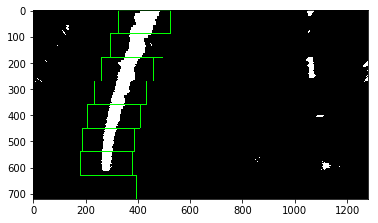

In [293]:
w = warped.copy()
w2 = np.dstack((w, w, w))
for i in range(n_windows):
    win_y_low = warped.shape[0] - (i+1)*window_height
    win_y_high = warped.shape[0] - i*window_height
    win_x_low = left_box_centers[i] - window_width
    win_x_high = left_box_centers[i] + window_width
    cv2.rectangle(w2, (win_x_low, win_y_low),(win_x_high, win_y_high),
    (0,255,0), 2) 
plt.imshow((w2 > 0).astype(np.uint8)*255)

In [271]:
w.min()

0.0

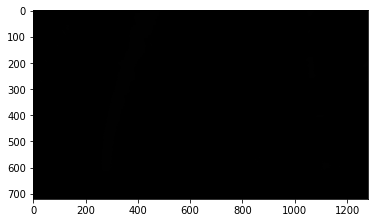

In [272]:
plt.imshow(w, cmap='gray')

434.278566274 1058.55294118
400.054485674 1054.49275362


ZeroDivisionError: Weights sum to zero, can't be normalized

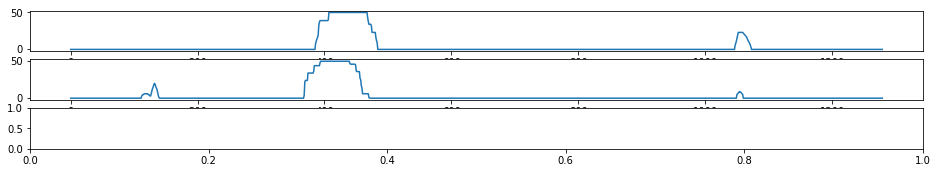

In [202]:
plt.figure(figsize=(16,16))
for i in range(0,warped.shape[0], 50):
    ax = plt.subplot(18,1,1+int(i/50))
    print(
        np.average(range(int(warped.shape[1]/2)),weights=warped[i:i+50,:int(warped.shape[1]/2)].sum(axis=0).astype(int)),
        np.average(range(int(warped.shape[1]/2),warped.shape[1]),weights=warped[i:i+50,int(warped.shape[1]/2):].sum(axis=0).astype(int))
    )
    plt.plot(warped[i:i+50,:].sum(axis=0))

In [183]:
warped.nonzero()

(array([  0,   0,   0, ..., 611, 611, 611]),
 array([407, 408, 409, ..., 287, 288, 289]))

# Lane Finding

In [116]:
vert

array([[[1216,  720],
        [  64,  720],
        [ 544,  432],
        [ 736,  432]]], dtype=int32)